In [1]:
import os
from IPython.display import Image
from IPython.core.display import HTML 
import time
import ast

In [2]:
graphname = 'trab2.graph'

In [27]:
def criarEntrada(v1,e1,v2,e2, graphviz):
    os.system(f'python src/generate.py {v1} {e1} {v2} {e2} {graphviz}')

In [102]:
m=60
criarEntrada(4*m, 5*m, 3*m, 4*m, graphname)

digraph {
	subgraph clusterG1 { graph [label="G"]
		 G207 -> G109 [arrowhead=none]
		 G219 -> G155 [arrowhead=none]
		 G235 -> G199 [arrowhead=none]
		 G104 -> G230 [arrowhead=none]
		 G219 -> G177 [arrowhead=none]
		 G190 -> G91 [arrowhead=none]
		 G215 -> G192 [arrowhead=none]
		 G129 -> G200 [arrowhead=none]
		 G195 -> G143 [arrowhead=none]
		 G193 -> G198 [arrowhead=none]
		 G216 -> G101 [arrowhead=none]
		 G203 -> G37 [arrowhead=none]
		 G187 -> G169 [arrowhead=none]
		 G186 -> G40 [arrowhead=none]
		 G54 -> G183 [arrowhead=none]
		 G184 -> G239 [arrowhead=none]
		 G192 -> G153 [arrowhead=none]
		 G197 -> G20 [arrowhead=none]
		 G186 -> G3 [arrowhead=none]
		 G215 -> G183 [arrowhead=none]
		 G110 -> G196 [arrowhead=none]
		 G183 -> G17 [arrowhead=none]
		 G151 -> G202 [arrowhead=none]
		 G233 -> G57 [arrowhead=none]
		 G89 -> G191 [arrowhead=none]
		 G151 -> G183 [arrowhead=none]
		 G167 -> G191 [arrowhead=none]
		 G232 -> G134 [arrowhead=none]
		 G199 -> G190 [arrowhead=none]
		 

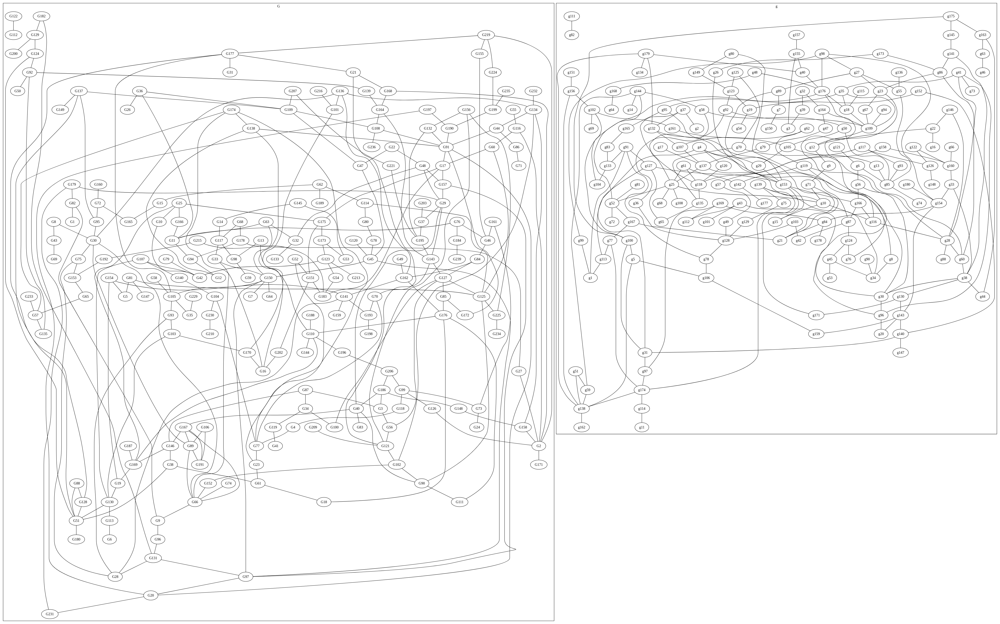

In [14]:
Image(filename= "graph2.png",  width=500, height=500)

In [11]:
def entradaSat(graph):
    return os.popen(f'python3 src/gen_input.py {graph}').read()

In [4]:
def satSolve(graphname):
    satin = graphname + '.satinput'
    satout = graphname + '.satoutput'
    os.system(f'./minisat_static {satin} {satout}')

In [9]:
def saidaSat2Problem(graphname):
    satout = graphname + '.satoutput'
    mapping = graphname  + '.mapping'
    a = os.popen(f'python src/gen_output.py {satout} {mapping}').read()
#     print(a)
    return a

In [6]:
def printMappingFunctionGraph(mappingFunction):
  print ('\tsubgraph mapG1G2 { graph [label="m"]')
  for g2, g1 in mappingFunction.items():
    print ("\t\t",  "g"+str(g2), "->", "G"+str(g1) + ' [color = red]')
  print ("\t}")

In [7]:
def checkSolution(graphname):
    mapping = graphname  + '.mapping'
    os.system(f'python src/check.py {graphname} {mapping}')

In [12]:
begin = time.time()
t = entradaSat(graphname)
print(f'Tempo para converter grafo para entrada SAT: {t}')
satSolve(graphname)
mappingFunction = ast.literal_eval(saidaSat2Problem(graphname).split('\n')[-2])
checkSolution(graphname)
end = time.time()
print(f'Tempo total para resolver: {end-begin}')

Tempo para converter grafo para entrada SAT: 3.928555488586426

==================================[MINISAT]===================================
| Conflicts |     ORIGINAL     |              LEARNT              | Progress |
|           | Clauses Literals |   Limit Clauses Literals  Lit/Cl |          |
|         0 |    3878  1180754 |    1292       0        0    -nan |  0.000 % |
restarts              : 1
conflicts             : 0              (0 /sec)
decisions             : 5              (39 /sec)
propagations          : 37450          (288962 /sec)
conflict literals     : 0              (-nan % deleted)
Memory used           : 17.70 MB
CPU time              : 0.129602 s

SATISFIABLE
True
Tempo total para resolver: 4.174609184265137


In [13]:
printMappingFunctionGraph(mappingFunction)

	subgraph mapG1G2 { graph [label="m"]
		 g175 -> G87 [color = red]
		 g145 -> G3 [color = red]
		 g23 -> G102 [color = red]
		 g67 -> G152 [color = red]
		 g27 -> G134 [color = red]
		 g156 -> G124 [color = red]
		 g138 -> G51 [color = red]
		 g127 -> G138 [color = red]
		 g65 -> G12 [color = red]
		 g70 -> G178 [color = red]
		 g135 -> G94 [color = red]
		 g89 -> G44 [color = red]
		 g153 -> G91 [color = red]
		 g100 -> G146 [color = red]
		 g129 -> G104 [color = red]
		 g128 -> G77 [color = red]
		 g164 -> G114 [color = red]
		 g30 -> G125 [color = red]
		 g166 -> G17 [color = red]
		 g116 -> G157 [color = red]
		 g87 -> G175 [color = red]
		 g99 -> G101 [color = red]
		 g1 -> G16 [color = red]
		 g47 -> G80 [color = red]
		 g79 -> G78 [color = red]
		 g119 -> G48 [color = red]
		 g142 -> G32 [color = red]
		 g114 -> G113 [color = red]
		 g11 -> G6 [color = red]
		 g77 -> G103 [color = red]
		 g174 -> G130 [color = red]
		 g137 -> G45 [color = red]
		 g10 -> G97 [color = red]
		 g7 -

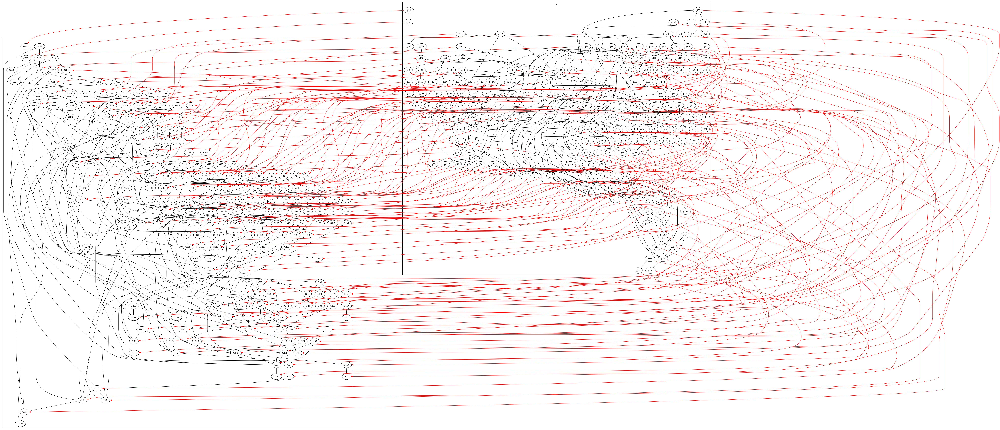

In [15]:
Image(filename= "graph2_mapping.png",  width=500, height=500)